This notebook analyzes the O$_2$ budget from MITgcm+BLING output. Dissolved oxygen in the ocean's interior is simulated following:

$$
\frac{\partial{O_2}}{\partial{t}}= \underbrace{- \frac{\partial{U.O_2}}{\partial{x}} -\frac{\partial{V.O_2}}{\partial{y}}}_\text{Lateral Advection}
- \overbrace{\frac{\partial{W.O_2}}{\partial{z}}}^\text{Vertical Advection}
+ \underbrace{A_h.\nabla^2{O_2}}_\text{Lateral Mixing}
+\overbrace{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}^\text{Vertical Mixing}
+ \underbrace{ J(O_2)  }_\text{Sources - Sinks}
$$

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
import warnings
warnings.simplefilter("ignore") # Silence warnings

import xarray as xr
import numpy as np
from tqdm import tqdm

import matplotlib.colors as colors
import matplotlib.ticker as mticker
import matplotlib.patches as patches
import cmocean
import cartopy
import cartopy.crs as ccrs
from cartopy import util
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import cartopy.feature as cft
import proplot
# from xmovie import *
import matplotlib.pyplot as plt
from utils import *

from xgcm import Grid

plt.rcParams["figure.facecolor"] = 'white'


---
## Spin up Dask Cluster/Client

In [11]:
C=CLSTR(1,15,109,36)
C

Connection method: Cluster object,Cluster type: dask_jobqueue.PBSCluster
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/yeddebba/proxy/41873/status,
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/yeddebba/proxy/41873/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://10.12.206.49:46837,Workers: 0
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/yeddebba/proxy/41873/status,Total threads: 0
Started: Just now,Total memory: 0 B


In [3]:
ds=xr.open_mfdataset('/glade/work/klindsay/cesm_inputdata/ecosys_jan_IC_omip_POP_tx0.1v3_c200423.nc')
ds

<xarray.Dataset>
Dimensions:      (z_t: 62, nlat: 2400, nlon: 3600, d2: 2, z_w: 62, z_w_bot: 62)
Coordinates:
    TLAT         (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    TLONG        (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
  * z_t          (z_t) float64 500.0 1.5e+03 2.5e+03 ... 5.625e+05 5.875e+05
  * z_w          (z_w) float64 0.0 1e+03 2e+03 ... 5.25e+05 5.5e+05 5.75e+05
  * z_w_bot      (z_w_bot) float64 1e+03 2e+03 3e+03 ... 5.5e+05 5.75e+05 6e+05
Dimensions without coordinates: nlat, nlon, d2
Data variables: (12/44)
    ALK          (z_t, nlat, nlon) float64 dask.array<chunksize=(62, 2400, 3600), meta=np.ndarray>
    ALK_ALT_CO2  (z_t, nlat, nlon) float64 dask.array<chunksize=(62, 2400, 3600), meta=np.ndarray>
    DIC          (z_t, nlat, nlon) float64 dask.array<chunksize=(62, 2400, 3600), meta=np.ndarray>
    DIC_ALT_CO2  (z_t, nlat, nlon) float64 dask.array<chunksize=(62, 2400, 3600), meta=np.ndarray>
    DOC          (z_t, nlat, nlon) float64 dask.array<chunksize=(62, 2400, 3600), meta=np.ndarray>
    DOCr         (z_t, nlat, nlon) float64 dask.array<chunksize=(62, 2400, 3600), meta=np.ndarray>
    ...           ...
    spCaCO3      (z_t, nlat, nlon) float64 dask.array<chunksize=(62, 2400, 3600), meta=np.ndarray>
    spChl        (z_t, nlat, nlon) float64 dask.array<chunksize=(62, 2400, 3600), meta=np.ndarray>
    spFe         (z_t, nlat, nlon) float64 dask.array<chunksize=(62, 2400, 3600), meta=np.ndarray>
    spP          (z_t, nlat, nlon) float64 dask.array<chunksize=(62, 2400, 3600), meta=np.ndarray>
    z_t_bounds   (z_t, d2) float64 dask.array<chunksize=(62, 2), meta=np.ndarray>
    zooC         (z_t, nlat, nlon) float64 dask.array<chunksize=(62, 2400, 3600), meta=np.ndarray>
Attributes:
    lateral_dims:       [2400 3600]
    vertical_dims:      62
    vert_grid_file:     /gpfs/fs1/work/klindsay/analysis/pop-tools/pop_tools/...
    horiz_grid_fname:   /glade/p/cesmdata/cseg/inputdata/ocn/pop/tx0.1v3/grid...
    topography_fname:   /glade/p/cesmdata/cseg/inputdata/ocn/pop/tx0.1v3/grid...
    region_mask_fname:  /glade/p/cesmdata/cseg/inputdata/ocn/pop/tx0.1v3/grid...
    type:               tripole
    title:              POP_tx0.1v3 grid
    history:            Thu Apr 23 15:58:12 2020: ncks -O -5 /glade/work/klin...
    input_file_list:    /glade/p/cesm/bgcwg/OMIPinit/woa13_temperature_OMIPin...
    NCO:                netCDF Operators version 4.7.9 (Homepage = http://nco...

In [6]:
ds=xr.open_mfdataset('/glade/work/mclong/cesm_inputdata/feventflux_5gmol_POP_tx0.1v3.c200616.nc')
ds

<xarray.Dataset>
Dimensions:      (z_t: 62, nlat: 2400, nlon: 3600)
Coordinates:
    TLAT         (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    TLONG        (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
  * z_t          (z_t) float64 500.0 1.5e+03 2.5e+03 ... 5.625e+05 5.875e+05
Dimensions without coordinates: nlat, nlon
Data variables:
    FESEDFLUXIN  (z_t, nlat, nlon) float32 dask.array<chunksize=(62, 2400, 3600), meta=np.ndarray>
    KMT          (nlat, nlon) int32 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
    TAREA        (nlat, nlon) float64 dask.array<chunksize=(2400, 3600), meta=np.ndarray>
Attributes:
    lateral_dims:       [2400 3600]
    vertical_dims:      62
    vert_grid_file:     tx0.1v3_vert_grid
    horiz_grid_fname:   inputdata/ocn/pop/tx0.1v3/grid/horiz_grid_200709.ieeer8
    topography_fname:   inputdata/ocn/pop/tx0.1v3/grid/topography_20170718.ie...
    region_mask_fname:  inputdata/ocn/pop/tx0.1v3/grid/region_mask_20170718.i...
    type:               tripole
    title:              POP_tx0.1v3 grid
    history:            Tue Jun 16 09:36:26 2020: ncks -O --fl_fmt=64bit /gla...
    NCO:                netCDF Operators version 4.7.9 (Homepage = http://nco...

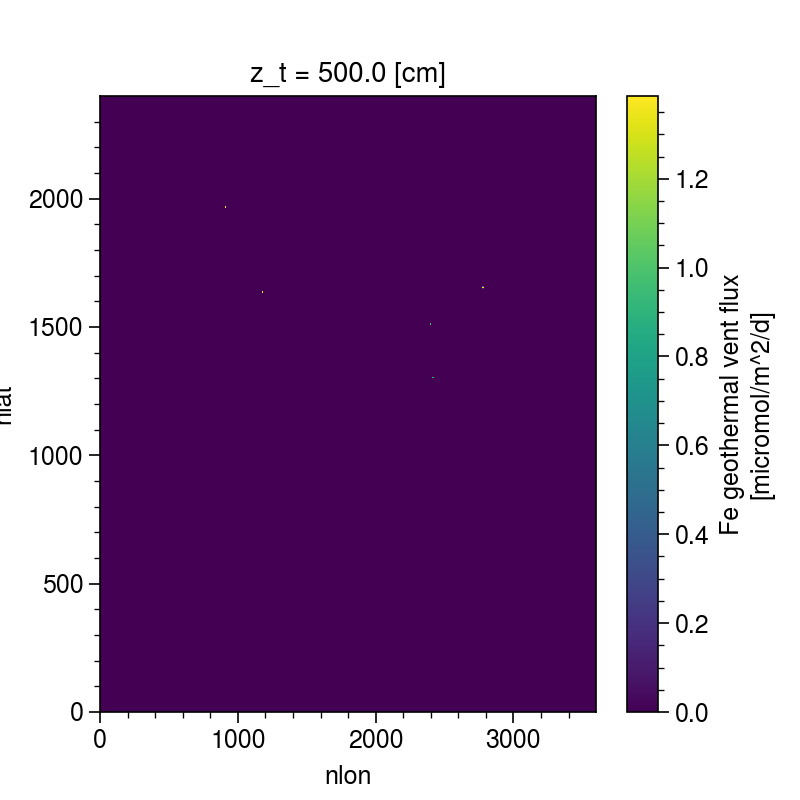

In [13]:
ds.FESEDFLUXIN.isel(z_t=0).plot()

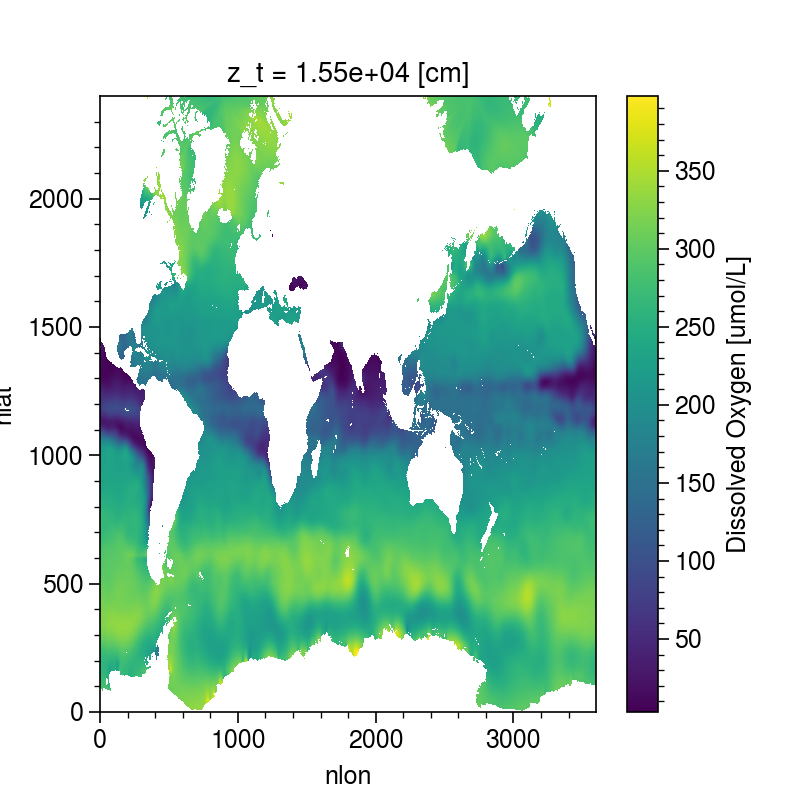

In [5]:
ds.O2.isel(z_t=15).plot()

In [8]:
def plot_depth_section(ax,x,z, var,cntf,lev,clr,units,title,coords,fs,fsx,lw,alp,cb_on,profile):
    if cntf==True: 
        cs= ax.contourf(x,z,var,levels=lev,cmap=clr,extend='both')
        if cb_on==True:
            cb = plt.colorbar(cs, ax=ax, orientation='vertical', extend='both',pad=0.02)#, aspect=20)  
#             cb.ax.set_title(units,fontsize=fs-1,pad=0.2)
            cb.set_label(units, rotation=0,size=fs-1,position=(1,1.06))
            cb.ax.tick_params(labelsize=fs-1)
            cb.ax.minorticks_off()
    if cntf==False: cs= ax.contour(x,z,var,colors=clr,linewidths=lw,levels=lev,alpha=alp)
    ax.set_title(title,loc='center',fontsize=fs)
    ax.set_ylim(coords[0]); ax.set_xlim(coords[1]); ax.minorticks_on(); 
    ax.set_ylabel('Depth (m)',fontsize=fs-2); 
    ax.set_aspect('auto')
    if profile=='lon': ax.set_xlabel('Latitude ($^{o}$N)',fontsize=fs-2)
    if profile=='lat': ax.set_xlabel('Longitude ($^{o}$E)',fontsize=fs-2)
    ax.set_title(title,pad=0.01,fontsize=fs, loc='center');
    ax.tick_params(axis='both', labelsize=fs)  
    return ax 

def plot_cmap(ax,lon,lat, var,vmn, vmx, stp, clr,units,title,coor,fs,fsx,lon_lab,lat_lab):
    ax.set_extent(coor,crs=cartopy.crs.PlateCarree())
    pc= ax.contourf(lon,lat,var,np.arange(vmn,vmx,stp),cmap=clr,transform=ccrs.PlateCarree(), extend='both') #, 
    land = ax.add_feature(cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',linewidth=0.1, edgecolor='black', facecolor='grey'))
    cb = plt.colorbar(pc, ax=ax, orientation='vertical', extend='both',pad=0.02)#, aspect=20)  
    cb.set_label(units, rotation=0,size=fs-1,position=(1.0,1.06))
    cb.ax.minorticks_off()
    cb.ax.tick_params(labelsize=fs)
    ax.set_aspect('auto')
    ax.set_title(title,loc='center',fontsize=fs)
    gl=ax.gridlines(draw_labels=True)
    gl.xlabel_style = {'size': fsx, 'color': 'black'}; gl.ylabel_style = {'size': fsx, 'color': 'black'}; 
    gl.xlabels_top = False; gl.ylabels_right= False; gl.xlines = False; gl.ylines = False
    gl.xlocator = mticker.FixedLocator(lon_lab); gl.ylocator = mticker.FixedLocator(lat_lab)
    gl.xformatter = LONGITUDE_FORMATTER ; gl.yformatter = LATITUDE_FORMATTER
    return ax


### XGCM Commands:
# grid.integrate(dst.TRAC03.isel(time=0), 'Z')
# grid.integrate(dst.TRAC03.isel(time=0), ['X', 'Y'])
# grid.integrate(dsl.TRAC03, ['X', 'Y', 'Z'])
# grid.average(dst.TRAC03.isel(time=0), ['Z'])
# grid.average(dsv.UVEL.isel(time=0), ['X','Y'])
# grid.cumint(-grid.integrate(dsv.UVEL.isel(time=0),'Z'),'Y', boundary='fill') 
# # grid.cumsum( -grid.integrate(dsv.UVEL.isel(time=4),'Z') * dsv.dyG, 'Y', boundary='fill')
# uvel_l = grid.interp(dsv.UVEL,'Z')
# grid.derivative(uvel_l.isel(time=0),'Z') 
# # grid.diff( uvel_l, 'Z' ) / ds.drW


# Load Monthly Mean Budget Terms and take the longterm mean 

In [6]:
dst=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/monthly/*O2_monthly.nc')
dst['rVOL']=dst.drF*dst.rA*dst.hFacC
dsw=dst.mean('month')
dsw

In [12]:
N=5
S=-5
W=160
E=100
Du=-50
Dl=-150

100%|██████████| 6/6 [01:19<00:00, 13.17s/it]


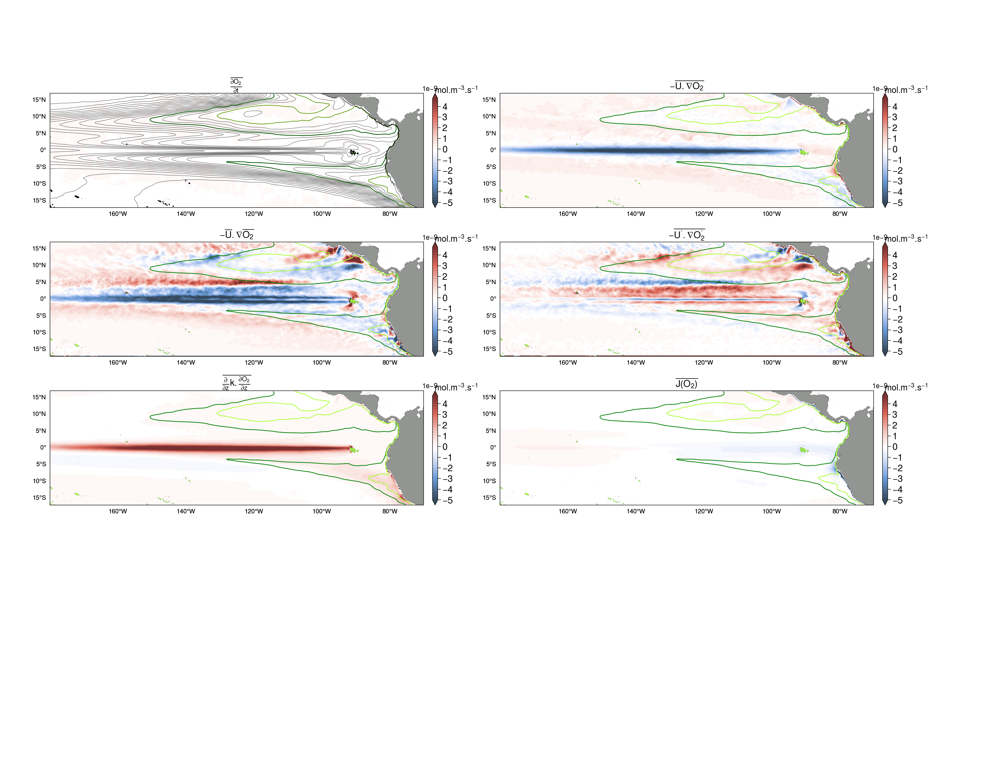

In [10]:
fig = plt.figure(figsize=(18,14),dpi=100)
fs=12; fsx=8
EE=-200.0; WW=-70.1; SS=-17.0; NN=17.1
coor=[EE,WW,SS,NN]; CL=215.0 # central longtiude 
lon_lab=np.concatenate([np.arange(EE,WW,20)])
lat_lab=np.arange(SS+2,NN-1,5)

clr_o2='NegPos'
omz_clr='green'
odz_clr='lime'

VAR= [((dsw.tend_O2*dsw.rVOL).sel(Z=slice(Du,Dl)).sum('Z'))/(dsw.rVOL.sel(Z=slice(Du,Dl)).sum('Z')),
      ((-(dsw.adv_h_O2+dsw.adv_v_O2)*dsw.rVOL).sel(Z=slice(Du,Dl)).sum('Z'))/(dsw.rVOL.sel(Z=slice(Du,Dl)).sum('Z')),
      ((-dsw.DIVd*dsw.rVOL).sel(Z=slice(Du,Dl)).sum('Z'))/(dsw.rVOL.sel(Z=slice(Du,Dl)).sum('Z')),      
      (((-dsw.DIVdp)*dsw.rVOL).sel(Z=slice(Du,Dl)).sum('Z'))/(dsw.rVOL.sel(Z=slice(Du,Dl)).sum('Z')),
      ((-dsw.dif_v_O2*dsw.rVOL).sel(Z=slice(Du,Dl)).sum('Z'))/(dsw.rVOL.sel(Z=slice(Du,Dl)).sum('Z')),
      ((dsw.bio_O2*dsw.rVOL).sel(Z=slice(Du,Dl)).sum('Z'))/(dsw.rVOL.sel(Z=slice(Du,Dl)).sum('Z')),
     ]

units=['mol.m$^{-3}$.s$^{-1}$']
title=[r'$\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r"$-\overline{U.\nabla{O_2}}$",
     r'$-\overline{U}.\nabla{\overline{O_2}}$ ',
     r"$-\overline{U'.\nabla{O_2'}}$",
     r'$\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r'$\overline{J(O_2)}$ ']


clrs=[clr_o2]
lmax=5e-9
lmin=-lmax
lstp=lmax*0.5e-1

gs = fig.add_gridspec(nrows=3, ncols=2, bottom=0.35,left=0.05, right=0.95, wspace=0.0, hspace=0.3)
rng=[0,1,2,3,4,5]
r=[0,0,1,1,2,2]
c=[0,1,0,1,0,1]

for i in tqdm(np.arange(0,6)):#len(VAR))):
    ax = fig.add_subplot(gs[r[i], c[i]] ,projection=ccrs.PlateCarree())
    ax = plot_cmap(ax,dsw.XC,dsw.YC, VAR[i],lmin, lmax, lstp,
                   clrs[0],units[0],title[i],coor,fs,fsx, lon_lab,lat_lab)
#     (dv.UVEL).isel(z_t=15).plot.contour(colors='black',linewidths=0.7,levels=np.arange(-150,150,50))
    ax.contour(dsw.XC,dsw.YC, dsw.TRAC03.isel(Z=15)*1e3,colors=omz_clr,linewidths=0.9,levels=np.arange(60,60.1,5))    
    ax.contour(dsw.XC,dsw.YC, dsw.TRAC03.isel(Z=15)*1e3,colors=odz_clr,linewidths=0.9,levels=np.arange(20,20.1,5)) 
    if i==0: 
        ax.contour(dsw.XC,dsw.YC, dsw.TRAC03.isel(Z=15)*1e3,colors='black',linewidths=0.3,levels=np.arange(0,200.1,10)) 
    gl=ax.gridlines(draw_labels=True)
    gl.xlabel_style = {'size': fsx, 'color': 'black'}; gl.ylabel_style = {'size': fsx, 'color': 'black'}; 
    gl.xlabels_top = False; gl.ylabels_right= False; gl.xlines = False; gl.ylines = False
    gl.xlocator = mticker.FixedLocator(lon_lab); gl.ylocator = mticker.FixedLocator(lat_lab)
    gl.xformatter = LONGITUDE_FORMATTER ; gl.yformatter = LATITUDE_FORMATTER

fig.tight_layout()

100%|██████████| 6/6 [00:48<00:00,  8.09s/it]


<bound method Figure.tight_layout of <Figure size 2500x700 with 12 Axes>>

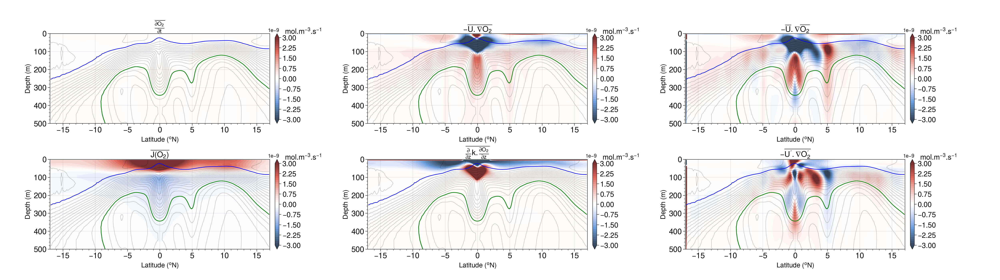

In [13]:
fig = plt.figure(figsize=(25,7),dpi=100,)
gs = fig.add_gridspec(nrows=2, ncols=3, left=0.05, right=0.95, wspace=0.2, hspace=0.4)

fs=14; fsx=8; 
SS=-17; NN=17
tops=0. ; bots=500.; 
coords=[[bots,tops],[SS,NN]]
clr_o2='NegPos'
omz_clr='green'
odz_clr='lime'
om_clr='blue'

var= [((dsw.tend_O2*dsw.rVOL).sel(XC=slice(360-W,360-E)).sum('XC'))/(dsw.rVOL.sel(XC=slice(360-W,360-E)).sum('XC')),
      ((-(dsw.adv_h_O2+dsw.adv_v_O2)*dsw.rVOL).sel(XC=slice(360-W,360-E)).sum('XC'))/(dsw.rVOL.sel(XC=slice(360-W,360-E)).sum('XC')),
      ((-(dsw.U_dO2+dsw.V_dO2+dsw.W_dO2)*dsw.rVOL).sel(XC=slice(360-W,360-E)).sum('XC'))/(dsw.rVOL.sel(XC=slice(360-W,360-E)).sum('XC')),      
      ((-dsw.DIVdp)*dsw.rVOL).sel(XC=slice(360-W,360-E)).sum('XC')/(dsw.rVOL.sel(XC=slice(360-W,360-E)).sum('XC')),      
      ((-dsw.dif_v_O2*dsw.rVOL).sel(XC=slice(360-W,360-E)).sum('XC'))/(dsw.rVOL.sel(XC=slice(360-W,360-E)).sum('XC')),
      ((dsw.bio_O2*dsw.rVOL).sel(XC=slice(360-W,360-E)).sum('XC'))/(dsw.rVOL.sel(XC=slice(360-W,360-E)).sum('XC')),
     ]

cntf= True ; cnt= False 
units=['mol.m$^{-3}$.s$^{-1}$']
title=[r'$\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r"$-\overline{U.\nabla{O_2}}$",
     r'$-\overline{U}.\nabla{\overline{O_2}}$ ',
     r"$-\overline{U'.\nabla{O_2'}}$",
     r'$\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r'$\overline{J(O_2)}$ ']

clr=[clr_o2]
lw=0.5; alp=1;cb_on=True

lo = -3e-9; hi = -lo; hi2 = -lo; dsc = -lo*0.5e-1
y=dsw.YC
z= dsw.Z*-1

i=[0,0,0,1,1,1]; j=[0,1,2,2,1,0]
for k in tqdm(np.arange(0,6)):#len(VAR))):
    ax = fig.add_subplot(gs[i[k],j[k]])
    cax= plot_depth_section(ax,y,z,var[k],cntf,np.arange(lo, hi+dsc, dsc),
                            clr[0],units[0],title[k],coords,fs,fsx,lw,alp,cb_on,'lon')
    pch= cax.contour(y, z,dsw.TRAC03.sel(XC=slice(360-W,360-E)).mean({'XC'})*1e3,
                     colors='black', alpha=0.5,linewidths=0.3, levels = np.arange(0,300.1,10))
    pch= cax.contour(y, z,dsw.TRAC03.sel(XC=slice(360-W,360-E)).mean({'XC'})*1e3,
                     colors=om_clr, alpha=1, linewidths=1, levels = np.arange(200,200.1,0.1))
    pch= cax.contour(y, z,dsw.TRAC03.sel(XC=slice(360-W,360-E)).mean({'XC'})*1e3,
                     colors=omz_clr, alpha=1, linewidths=1, levels = np.arange(60,60.1,0.1))
    # pch= cax.contour(y, z,dsw.TRAC03.sel(XC=slice(360-W,360-E)).mean({'XC'})*1e3,
    #                  colors=odz_clr, alpha=1, linewidths=1, levels = np.arange(20,20.1,0.1))
    
    
fig.tight_layout

In [484]:

# for j in tqdm(np.arange(0,8)):
#     N=73
#     dsv=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/tpfwd6_?VEL_5day_201'+str(j)+'.nc').isel(time=np.arange(0,N))
#     dst=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/tpfwd6_T*_5day_201'+str(j)+'.nc').isel(time=np.arange(0,N))
#     dsp=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/tpfwd6_PD_5day_201'+str(j)+'.nc').isel(time=np.arange(0,N))
#     dsb=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/tpfwd6_*_O2_5day_201'+str(j)+'.nc').isel(time=np.arange(0,N))
#     dsb['time']=dst.time
#     dsb2=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/tpfwd6_adv_[hv][uw]O2_5day_201'+str(j)+'.nc').isel(time=np.arange(0,N))
#     dsb2['time']=dst.time
#     dsb=xr.merge([dsb,dsb2],compat='override')
#     dsb['rVOL']=dst.drF*dst.rA*dst.hFacC
#     dst=xr.merge([dst,dsv,dsp],compat='override')
#     dst['rVOL']=dst.drF*dst.rA*dst.hFacC
#     dsb.to_netcdf('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/budgets_201'+str(j)+'.nc')
#     dst.to_netcdf('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/variables_201'+str(j)+'.nc')

100%|██████████| 8/8 [08:59<00:00, 67.42s/it]


In [48]:
# import gsw

# # 5-day mean temp, O2 and salt from Forward MITgcm run with BGC
# for j in tqdm(np.arange(5,8)):
#     dst=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/tpfwd6_THETA_5day_201'+str(j)+'.nc')
#     dss=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/tpfwd6_SALT_5day_201'+str(j)+'.nc')
#     dsp=xr.Dataset()
#     dsp['PD']=gsw.density.sigma0(dss.SALT,dst.THETA)+1000
#     dsp.PD.attrs['long_name']='Potential density'
#     dsp.PD.attrs['units']='kg m-3'
#     dsp.to_netcdf('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/tpfwd6_PD_5day_201'+str(j)+'.nc')

100%|██████████| 3/3 [01:11<00:00, 23.78s/it]


In [16]:
# rho = np.arange(1022.5,1027.5, 0.25)

# for j in tqdm(np.arange(6,8)):
#     dsp=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/variables_201'+str(j)+'.nc',chunks={"time":5,"XC":300,"YC":50})
#     grid = Grid(dsp, coords={'Z': {'center':'Z'}}, periodic=False)
#     ds_rho=xr.Dataset()
#     ds_rho['TRAC03'] = grid.transform(dsp.TRAC03,'Z',rho,target_data=dsp.PD)
#     ds_rho.to_netcdf('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/rho_O2_5day_201'+str(j)+'.nc')

100%|██████████| 2/2 [09:47<00:00, 293.83s/it]


In [34]:
dsv=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/variables_201?.nc')
dsv

dso=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/TPOSE/MITgcm_BLING_BUDGET_2010_2013_5DAY/budgets/rho_O2_5day_201?.nc')
dso

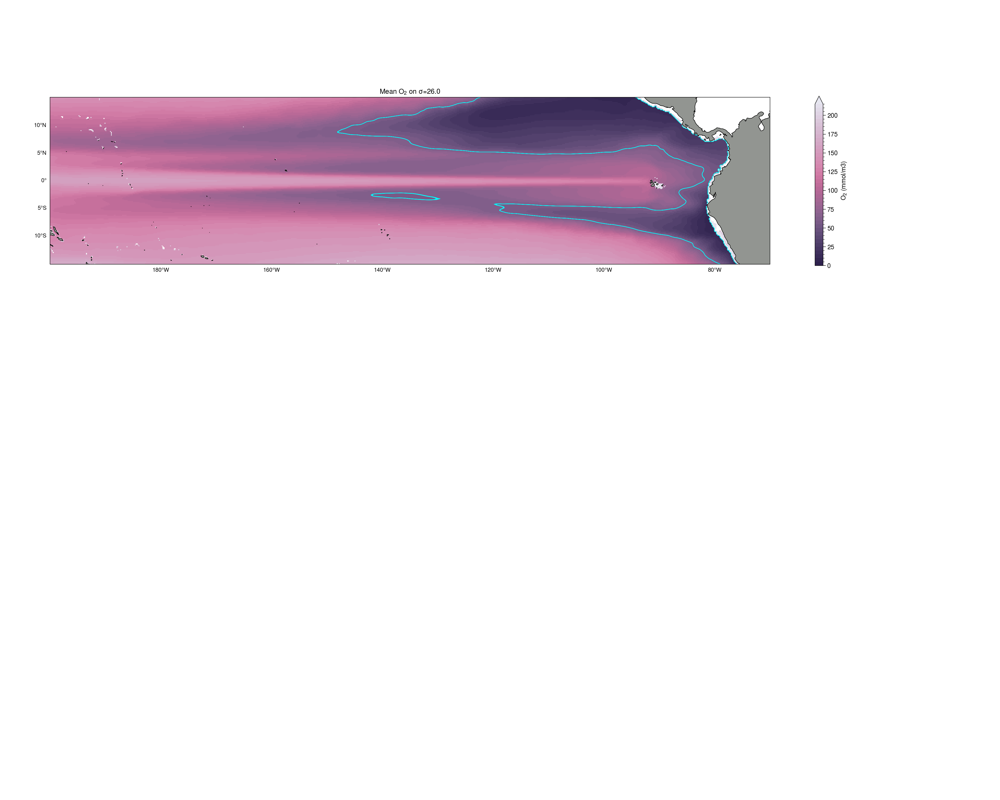

In [22]:
rho =1026
land_50m = cft.NaturalEarthFeature('physical', 'land', '50m',
                                   edgecolor='black', facecolor='gray', linewidth=0.5)
projection=ccrs.Mercator(central_longitude=-200.0, min_latitude=-15.0, max_latitude=15.0) #
fsx=10
fs=16

EE=-200.0; WW=-70.1; SS=-17.0; NN=17.1
lon_lab=np.concatenate([np.arange(EE,WW,20)])
lat_lab=np.arange(SS+2,NN-1,5)

fig = plt.figure(figsize=(20,16),dpi=100)
gs = fig.add_gridspec(nrows=2, ncols=1, bottom=0.35,left=0.05, right=0.95, wspace=0.1, hspace=0.5)
ax = fig.add_subplot(gs[0, 0],projection=projection)
ax.set_extent([-200, -70, -17, 17], crs=ccrs.PlateCarree())
ax.add_feature(land_50m)
ax.coastlines(resolution='50m')
p1=(dso.TRAC03.sel(PD=rho).mean('time')*1e3).plot(cmap='acton',add_colorbar=False,levels=np.arange(0,220,5), transform=ccrs.PlateCarree())
(dso.TRAC03.sel(PD=rho).mean('time')*1e3).plot.contour(x='XC', y='YC',vmin=60, vmax=60.1, colors='cyan', linewidths=0.6, transform=ccrs.PlateCarree())
cbar = plt.colorbar(p1)
cbar.set_label('O$_2$ (mmol/m3)');
plt.title("Mean O$_2$ on $\sigma$="+str((rho-1e3))[:4])
plt.ylabel('latitude (N)')
plt.xlabel('longitude (E)')
gl=ax.gridlines(draw_labels=True)
gl.xlabel_style = {'size': fsx, 'color': 'black'}; gl.ylabel_style = {'size': fsx, 'color': 'black'}; 
gl.xlabels_top = False; gl.ylabels_right= False; gl.xlines = False; gl.ylines = False
gl.xlocator = mticker.FixedLocator(lon_lab); gl.ylocator = mticker.FixedLocator(lat_lab)
gl.xformatter = LONGITUDE_FORMATTER ; gl.yformatter = LATITUDE_FORMATTER    

100%|██████████| 6/6 [00:18<00:00,  3.04s/it]


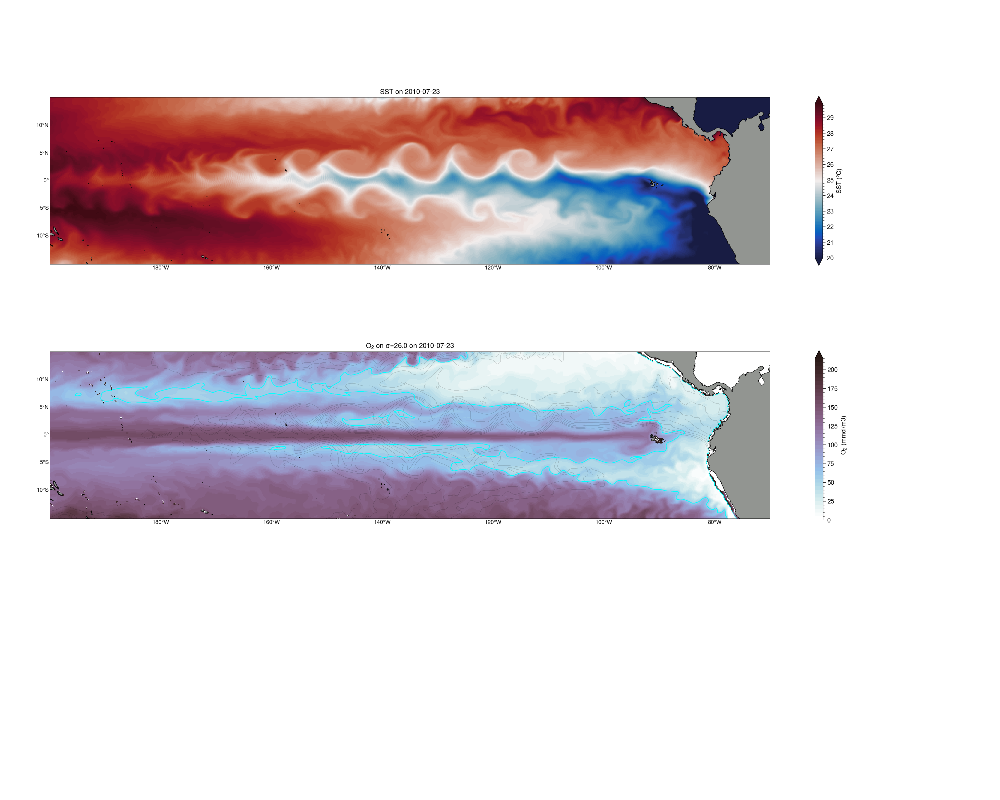

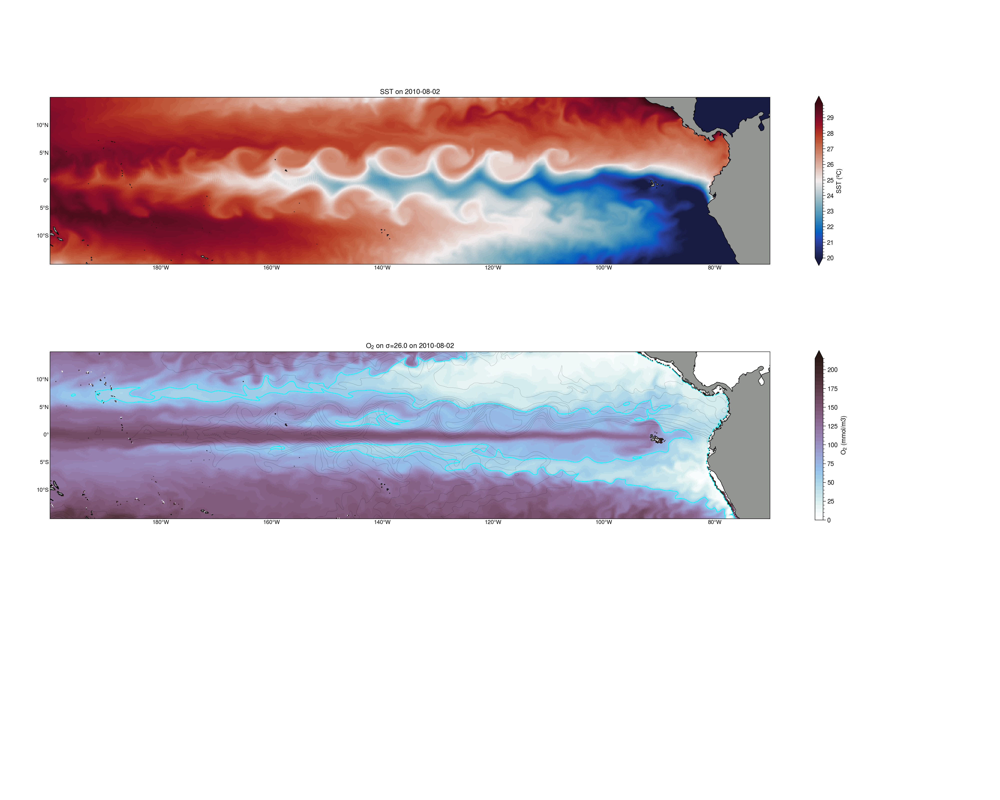

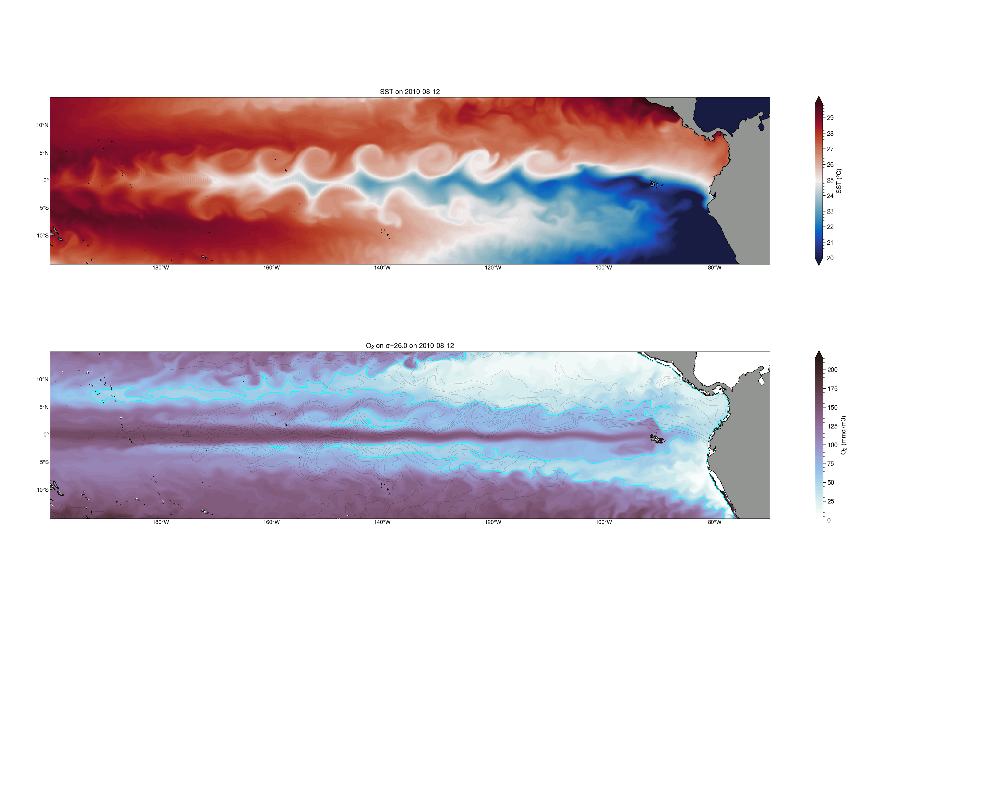

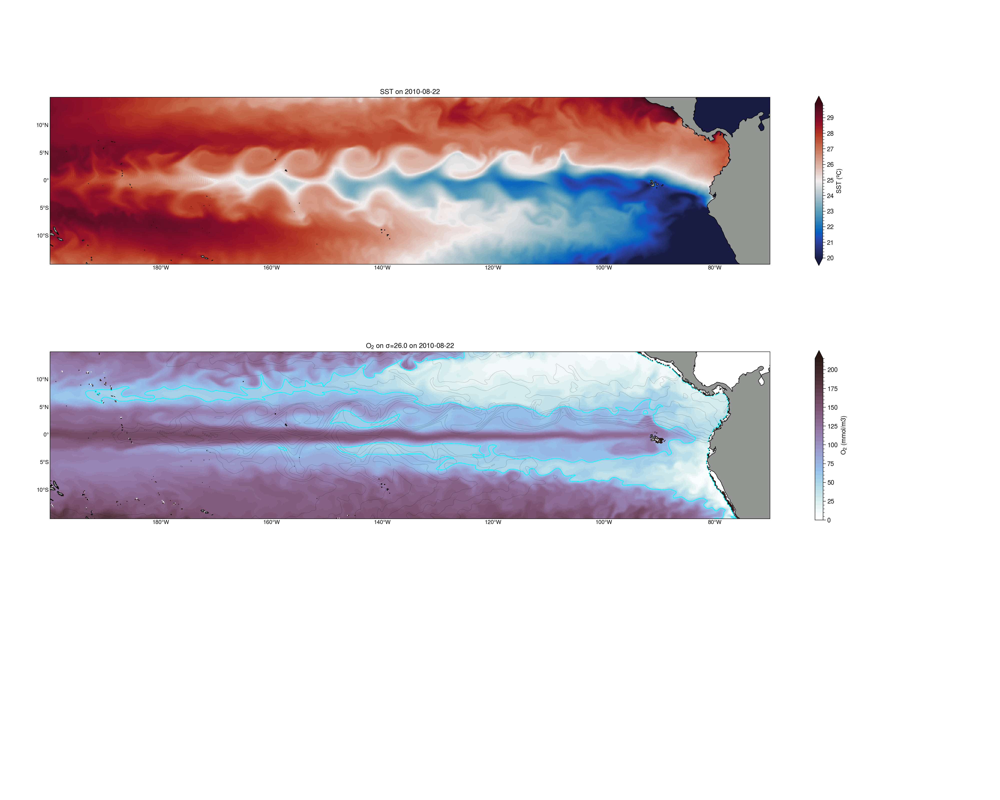

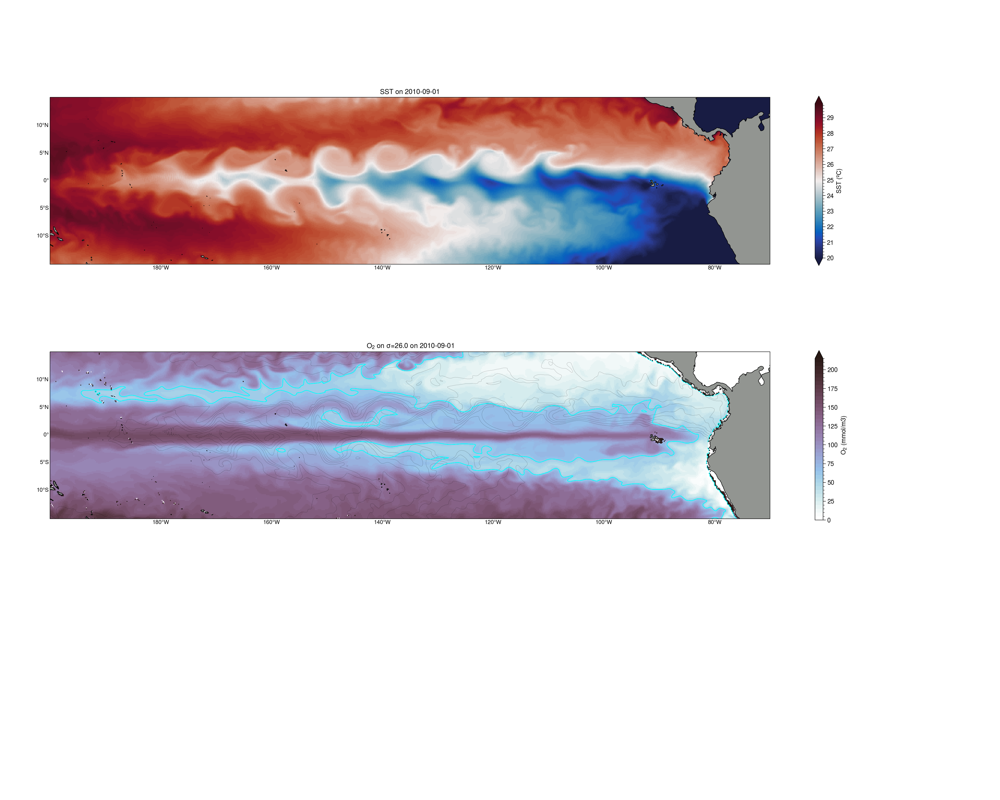

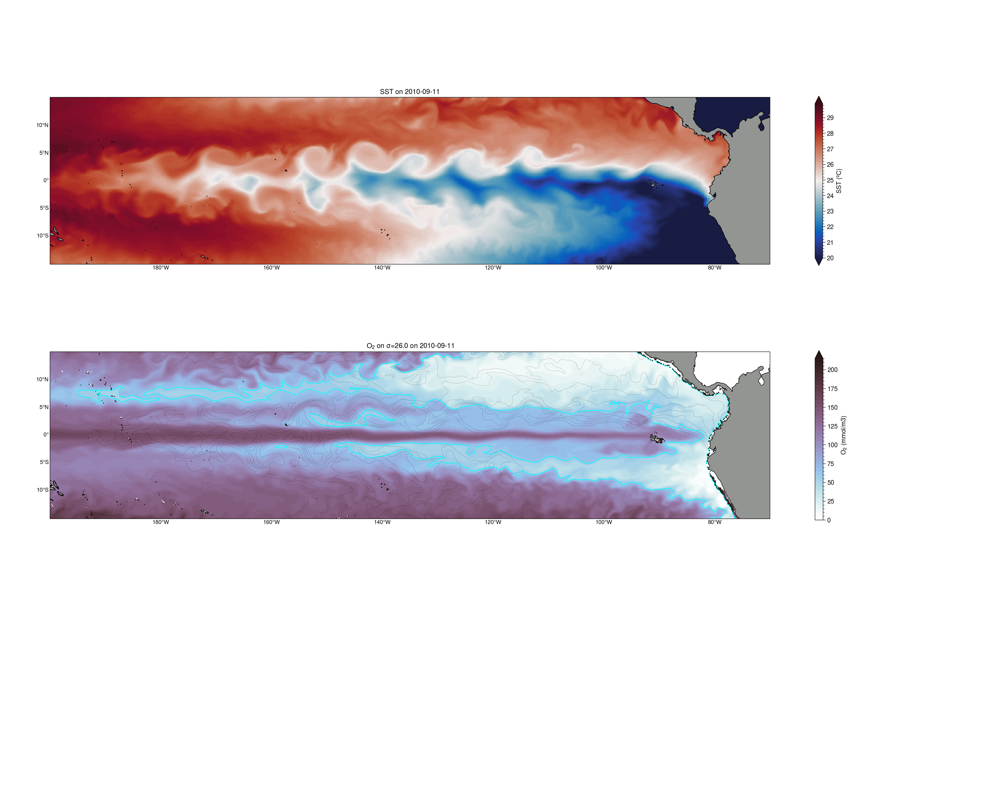

In [91]:
rho =1026
land_50m = cft.NaturalEarthFeature('physical', 'land', '50m',
                                   edgecolor='black', facecolor='gray', linewidth=0.5)
projection=ccrs.Mercator(central_longitude=-200.0, min_latitude=-15.0, max_latitude=15.0) #
fsx=8
fs=10

EE=-200.0; WW=-70.1; SS=-17.0; NN=17.1
lon_lab=np.concatenate([np.arange(EE,WW,20)])
lat_lab=np.arange(SS+2,NN-1,5)

for i in tqdm(np.arange(40,51,2)):
    fig = plt.figure(figsize=(20,16),dpi=100)
    gs = fig.add_gridspec(nrows=2, ncols=1, bottom=0.35,left=0.05, right=0.95, wspace=0.1, hspace=0.5)
    ax = fig.add_subplot(gs[0, 0],projection=projection)
    ax.set_extent([-200, -70, -15, 15], crs=ccrs.PlateCarree())
    ax.add_feature(land_50m)
    ax.coastlines(resolution='50m')
    p1=dsv.THETA.isel(Z=0,time=i).plot(cmap='cmo.balance',add_colorbar=False,levels=np.arange(20,30,0.1), transform=ccrs.PlateCarree())
    cbar = plt.colorbar(p1)
    cbar.set_label('SST (ºC)')
    plt.title("SST on "+ str(dso.time[i])[36:46])
    plt.ylabel('latitude (N)')
    plt.xlabel('longitude (E)')
    gl=ax.gridlines(draw_labels=True)
    gl.xlabel_style = {'size': fsx, 'color': 'black'}; gl.ylabel_style = {'size': fsx, 'color': 'black'}; 
    gl.xlabels_top = False; gl.ylabels_right= False; gl.xlines = False; gl.ylines = False
    gl.xlocator = mticker.FixedLocator(lon_lab); gl.ylocator = mticker.FixedLocator(lat_lab)
    gl.xformatter = LONGITUDE_FORMATTER ; gl.yformatter = LATITUDE_FORMATTER


    ax = fig.add_subplot(gs[1, 0],projection=projection)
    ax.set_extent([-200, -70, -15, 15], crs=ccrs.PlateCarree())
    ax.add_feature(land_50m)
    ax.coastlines(resolution='50m')
    p1=(dso.TRAC03.sel(PD=rho).isel(time=i)*1e3).plot(cmap='glacial',add_colorbar=False,levels=np.arange(0,220,5), transform=ccrs.PlateCarree())
    dsv.THETA.isel(Z=0,time=i).plot.contour(x='XC', y='YC',levels=np.arange(24,28,0.5), colors='black', linewidths=0.1, transform=ccrs.PlateCarree())
    (dso.TRAC03.sel(PD=rho).isel(time=i)*1e3).plot.contour(x='XC', y='YC',vmin=60, vmax=60.1, colors='cyan', linewidths=0.6, transform=ccrs.PlateCarree())
    # dsv.TRAC03.isel(Z=15,time=i).plot(cmap='bone',levels=np.arange(0,0.220,0.005))
    cbar = plt.colorbar(p1)
    cbar.set_label('O$_2$ (mmol/m3)');
    plt.title("O$_2$ on $\sigma$="+str((rho-1e3))[:4]+" on "+ str(dso.time[i])[36:46])
    plt.ylabel('latitude (N)')
    plt.xlabel('longitude (E)')
    gl=ax.gridlines(draw_labels=True)
    gl.xlabel_style = {'size': fsx, 'color': 'black'}; gl.ylabel_style = {'size': fsx, 'color': 'black'}; 
    gl.xlabels_top = False; gl.ylabels_right= False; gl.xlines = False; gl.ylines = False
    gl.xlocator = mticker.FixedLocator(lon_lab); gl.ylocator = mticker.FixedLocator(lat_lab)
    gl.xformatter = LONGITUDE_FORMATTER ; gl.yformatter = LATITUDE_FORMATTER

    # savefig(fig,'animations/TIVs_'+str(i).zfill(3))

    